En el apartado "Loading Data" de esta URL:

https://www.datacamp.com/community/tutorials/svm-classification-scikit-learn-python

Se explica cómo se cargan una serie de datos: 

1. Utiliza esa misma forma para cargar los datos.
2. Limpia los datos si es necesario
3. Dibuja con plotly los que creas necesarios gráficos para entender los datos.
4. Utiliza los métodos de clasificación vistos hasta ahora para clasificar el target de los datos, ¿cuál da mejores resultados? 
5. Intenta superarte en el score cambiando las features de los algoritmos.

In [1]:
#Import scikit-learn dataset library
from sklearn import datasets
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Load dataset
cancer = datasets.load_breast_cancer()

In [3]:
# print the names of the 13 features
print("Features: ", cancer.feature_names)

# print the label type of cancer('malignant' 'benign')
print("Labels: ", cancer.target_names)


Features:  ['mean radius' 'mean texture' 'mean perimeter' 'mean area'
 'mean smoothness' 'mean compactness' 'mean concavity'
 'mean concave points' 'mean symmetry' 'mean fractal dimension'
 'radius error' 'texture error' 'perimeter error' 'area error'
 'smoothness error' 'compactness error' 'concavity error'
 'concave points error' 'symmetry error' 'fractal dimension error'
 'worst radius' 'worst texture' 'worst perimeter' 'worst area'
 'worst smoothness' 'worst compactness' 'worst concavity'
 'worst concave points' 'worst symmetry' 'worst fractal dimension']
Labels:  ['malignant' 'benign']


In [4]:
cancer

{'data': array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
         1.189e-01],
        [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
         8.902e-02],
        [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
         8.758e-02],
        ...,
        [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
         7.820e-02],
        [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
         1.240e-01],
        [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
         7.039e-02]]),
 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
        1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
        1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0

In [5]:
# print data(feature)shape
type(cancer.data)

numpy.ndarray

In [6]:
cancer.data.shape

(569, 30)

In [7]:
cancer.target.shape

(569,)

In [8]:
cancer_df = pd.DataFrame(cancer.data, columns = cancer.feature_names)

In [9]:
cancer_df.head(10)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,0.07613,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,0.05742,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,0.07451,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,0.07389,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,0.08243,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


In [10]:
cancer_df['target'] = cancer.target

Creacion del dataframe cancer_df para graficar y explorar los datos mas fácilmente

In [11]:
cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [12]:
cancer_df.target.value_counts()

1    357
0    212
Name: target, dtype: int64

In [13]:
cancer_df.describe(include="all")

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [14]:
cancer_df.iloc[:,[0,1,2,3,4,5,6,7,8,9,30]]

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0
...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,0
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0


In [15]:
cancer_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

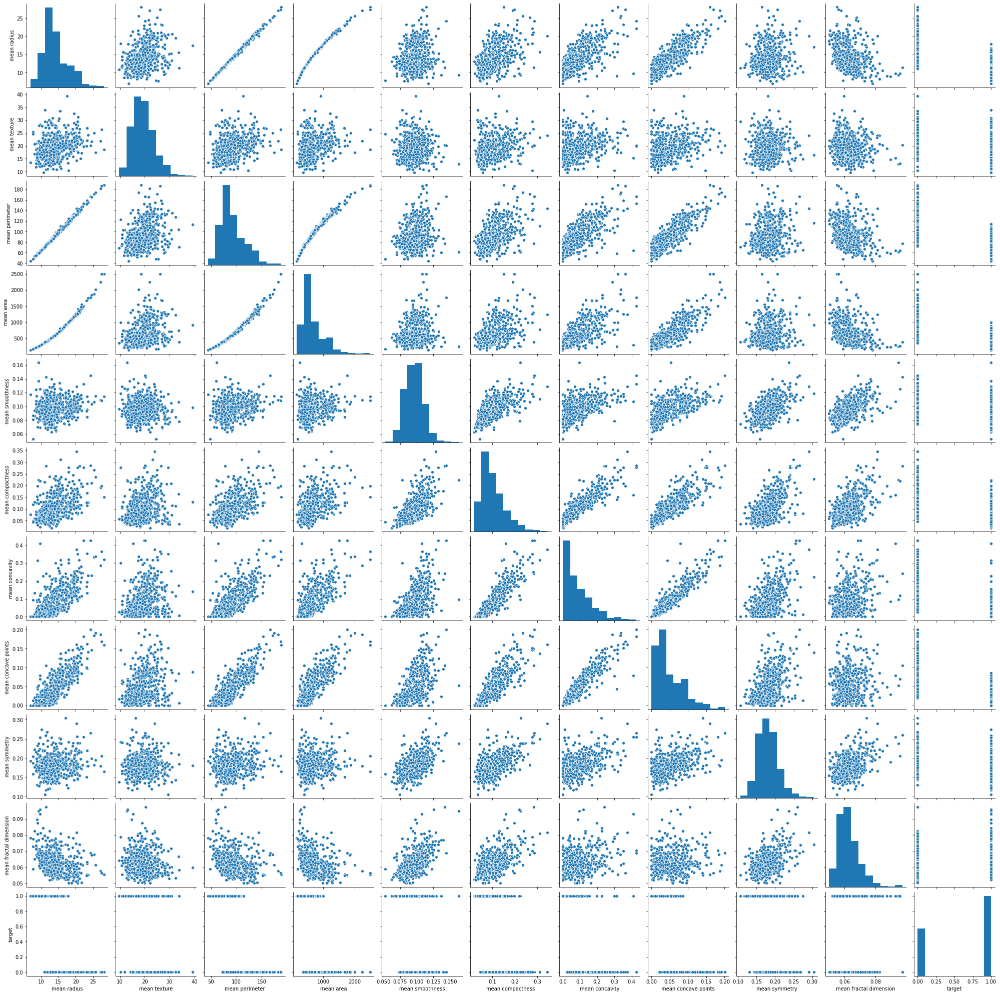

In [16]:
#sns.pairplot(cancer_df[['mean radius', 'mean texture', 'mean perimeter', 'mean area','mean smoothness', 'mean compactness', 'mean concavity','mean concave points', 'mean symmetry', 'mean fractal dimension','target']])# , hue = "target")

Ver la correlación del `target` con las columnas del dataframe a ver si nos debemos centrar en algunas para el análisis. Se hace en tres pasos para evaluar con  
Valores medios de las características (columnas 0 a 9)  
Errores (columnas 10 a 19)  
Peor valor (columnas 20 a 29)  

In [16]:
# Correlación con las columnas de las medias de las características
corr = cancer_df.loc[:,['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry', 'mean fractal dimension',
       'target']].corr()

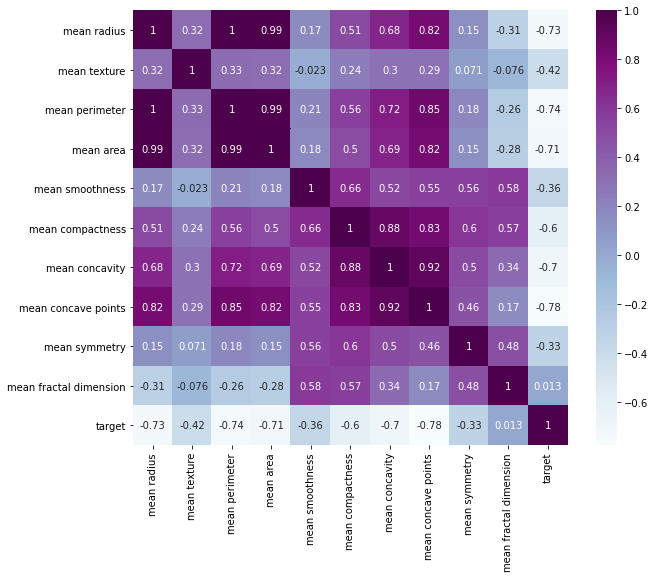

In [17]:
plt.subplots(figsize=(10, 8)) 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),  cmap= "BuPu", square=True,  annot=True)

In [18]:
# Correlación con columnas del error
corr = cancer_df.loc[:,['radius error', 'texture error', 'perimeter error', 'area error',
       'smoothness error', 'compactness error', 'concavity error',
       'concave points error', 'symmetry error', 'fractal dimension error',
       'target']].corr()

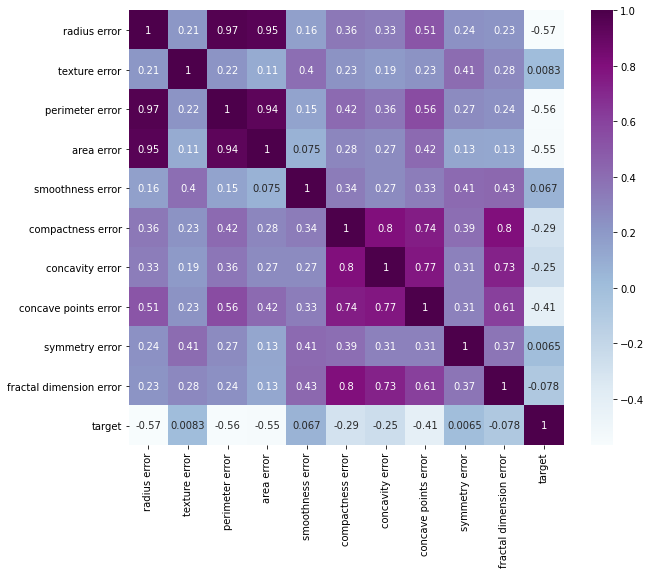

In [19]:
plt.subplots(figsize=(10, 8)) 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),  cmap= "BuPu", square=True,  annot=True)

In [20]:
# Correlación con columnas del peor de los casos (Worst)
corr = cancer_df.loc[:,['worst radius', 'worst texture', 'worst perimeter', 'worst area',
       'worst smoothness', 'worst compactness', 'worst concavity',
       'worst concave points', 'worst symmetry', 'worst fractal dimension',
       'target']].corr()

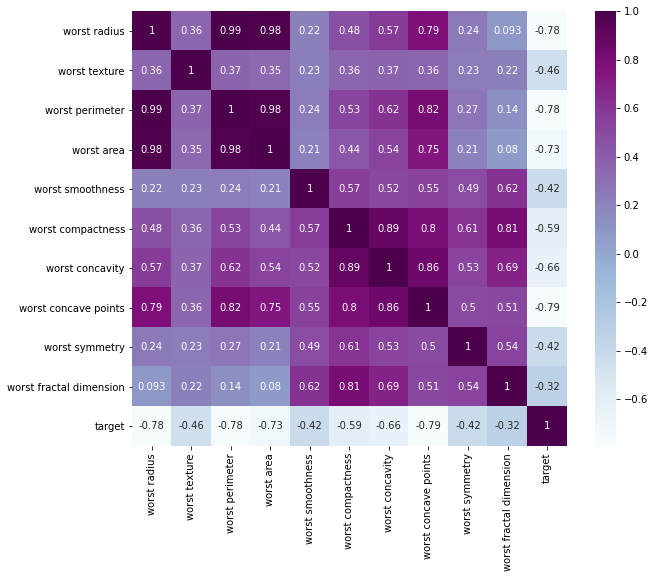

In [21]:
plt.subplots(figsize=(10, 8)) 
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool),  cmap= "BuPu", square=True,  annot=True)

De acuerdo a lo anterior las columnas cuya correlación con el target es mayor son  
`'mean radius',  'mean perimeter', 'mean area','mean compactness', 'mean concavity','mean concave points', `  

y también las correspondientes al peor caso de cada una (Worst)

In [22]:
X =  cancer_df[['mean radius', 'mean perimeter', 'mean area','mean compactness', 'mean concavity','mean concave points']]
y = cancer_df['target']

Conjunto de entrenamiento (80%) y test (20%)

In [23]:
from sklearn.model_selection import train_test_split
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=1)
print(X_train.shape)
print(X_test.shape)

(455, 6)
(114, 6)


### Usando Logistic Regression

In [24]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)

LogisticRegression()

In [25]:
y_pred = model.predict(X_test)

In [26]:
from sklearn import metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred)*100, "%")

Accuracy: 86.8421052631579 %


In [27]:
print("Score Train: ", model.score(X_train,y_train)*100, "%")
print("Score Total: ", model.score(X,y)*100, "%")

Score Train:  90.76923076923077 %
Score Total:  89.98242530755711 %


In [28]:

#Prueba con las columnas Worst
XW =  cancer_df[['worst radius', 'worst perimeter', 'worst area',
     'worst compactness', 'worst concavity',
       'worst concave points']]
yw = cancer_df['target']
# Split dataset into training set and test set
Xw_train, Xw_test, yw_train, yw_test = train_test_split(XW, yw, test_size=0.20, random_state=5)
model = LogisticRegression()
model.fit(Xw_train, yw_train)
yw_pred = model.predict(Xw_test)
print("Accuracy:",metrics.accuracy_score(yw_test, yw_pred)*100, "%")

Accuracy: 93.85964912280701 %


In [29]:
print("Score Train: ", model.score(Xw_train,yw_train)*100, "%")
print("Score Total: ", model.score(XW,yw)*100, "%")

Score Train:  92.96703296703296 %
Score Total:  93.14586994727593 %


## SVM

### Linear SVC

In [30]:
from sklearn import svm
Clist = [1,10,100,1000]

In [31]:
for C in Clist:
    clf = svm.LinearSVC(C=C)
    clf.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print ('score: C = ', str(C), ": ", clf.score(X_test, y_test)*100, "%")

score: C =  1 :  82.45614035087719 %
score: C =  10 :  71.9298245614035 %
score: C =  100 :  80.7017543859649 %
score: C =  1000 :  54.385964912280706 %


### RBF (Radial Basis Function)

In [32]:
clist = [1,10,100,1000]
gamma_list = [0.00001,0.001, 0.1,0.2,10]

In [33]:
for c in clist:
    for g in gamma_list:
        clf = svm.SVC(C=c, kernel='rbf', gamma=g)
        clf.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        print ('score C =',str(c), "- gamma =", str(g), " : ", clf.score(X_test, y_test)*100, "%")

score C = 1 - gamma = 1e-05  :  88.59649122807018 %
score C = 1 - gamma = 0.001  :  88.59649122807018 %
score C = 1 - gamma = 0.1  :  80.7017543859649 %
score C = 1 - gamma = 0.2  :  80.7017543859649 %
score C = 1 - gamma = 10  :  62.28070175438597 %
score C = 10 - gamma = 1e-05  :  88.59649122807018 %
score C = 10 - gamma = 0.001  :  87.71929824561403 %
score C = 10 - gamma = 0.1  :  81.57894736842105 %
score C = 10 - gamma = 0.2  :  79.82456140350878 %
score C = 10 - gamma = 10  :  62.28070175438597 %
score C = 100 - gamma = 1e-05  :  87.71929824561403 %
score C = 100 - gamma = 0.001  :  89.47368421052632 %
score C = 100 - gamma = 0.1  :  81.57894736842105 %
score C = 100 - gamma = 0.2  :  78.94736842105263 %
score C = 100 - gamma = 10  :  62.28070175438597 %
score C = 1000 - gamma = 1e-05  :  85.96491228070175 %
score C = 1000 - gamma = 0.001  :  84.21052631578947 %
score C = 1000 - gamma = 0.1  :  81.57894736842105 %
score C = 1000 - gamma = 0.2  :  78.94736842105263 %
score C = 10

## KNN

In [34]:
from sklearn.neighbors import KNeighborsClassifier


In [35]:
# Probar el modelo con diferentes valores de k
for k in range (1,20):
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X_train, y_train)  
    y_pred = model.predict(X_test)
    print("Accuracy: k=(", k, ") " ,metrics.accuracy_score(y_test, y_pred)*100, "%")

Accuracy: k=( 1 )  79.82456140350878 %
Accuracy: k=( 2 )  81.57894736842105 %
Accuracy: k=( 3 )  85.96491228070175 %
Accuracy: k=( 4 )  82.45614035087719 %
Accuracy: k=( 5 )  85.96491228070175 %
Accuracy: k=( 6 )  83.33333333333334 %
Accuracy: k=( 7 )  85.08771929824562 %
Accuracy: k=( 8 )  84.21052631578947 %
Accuracy: k=( 9 )  87.71929824561403 %
Accuracy: k=( 10 )  83.33333333333334 %
Accuracy: k=( 11 )  85.08771929824562 %
Accuracy: k=( 12 )  85.96491228070175 %
Accuracy: k=( 13 )  85.96491228070175 %
Accuracy: k=( 14 )  87.71929824561403 %
Accuracy: k=( 15 )  86.8421052631579 %
Accuracy: k=( 16 )  85.96491228070175 %
Accuracy: k=( 17 )  88.59649122807018 %
Accuracy: k=( 18 )  88.59649122807018 %
Accuracy: k=( 19 )  88.59649122807018 %


`knn = El mejor valor lo alcanza para k=3  a partir del cual el valor no mejora`

## Decision Trees

In [36]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RepeatedStratifiedKFold, RepeatedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold, RepeatedKFold


In [37]:
# define the model
model = RandomForestClassifier()

In [38]:
X_train.shape

(455, 6)

In [39]:
y_test.shape

(114,)

In [40]:
rkf = RepeatedKFold(n_splits=4, n_repeats=2, random_state=2)

In [41]:
# define the model
model = RandomForestClassifier()
# evaluate the model 
# THIS DOESN'T TRAIN THE MODEL
k_fold = KFold(n_splits=10, random_state=1)
n_scores = cross_val_score(model, X_train, y_train, scoring='accuracy', cv=k_fold, n_jobs=-1 
,error_score='raise')
# report performance
print('Accuracy: %.3f (%.3f)' % (mean(n_scores)*100, std(n_scores)*100),"%")

Accuracy: 89.237 (3.956) %


In [42]:
# Ajustand el modelo con todos los datos
model.fit (X_train, y_train)
print ("Score Train:", model.score (X_train, y_train)*100,"%")
print ("Score Test:", model.score (X_test,y_test)*100,"%")

Score Train: 100.0 %
Score Test: 91.22807017543859 %


In [44]:
#Convierto a series para ajustar el modelo (como en el ejemplo de clase)
X2_train = X_train.to_numpy()
y2_train=y_train.values

In [45]:
# Ajustando el modelo con validación cruzada y 4 splits
model = RandomForestClassifier()
k_fold = KFold(n_splits=4, random_state=1)

[model.fit(X2_train[train], y2_train[train]).score(X2_train[val], y2_train[val]) for train, val in k_fold.split(X2_train)]

[0.9035087719298246,
 0.9122807017543859,
 0.9210526315789473,
 0.9292035398230089]

### En 4 splits se obtiene más de 92,5 de media..

### `Con las columnas Worst, se obtuvo el mejor resultado con todos los datos (93%) - usando Logistic Regression, 

### El mejor modelo de los evaluados `con las columnas de media` hasta aquí pareciera el RandomForestClassifier() con un Score de 92.536%`

In [46]:
import pickle

Entrenando el modelo con varios epochs y batchs

In [47]:
k_fold = RepeatedKFold(n_splits=8, n_repeats=5, random_state=1)
val_score = []
train_score = []
# define the model
model = RandomForestClassifier()

for i, (train, val) in enumerate(k_fold.split(X2_train)):
    # train the model
    model.fit(X2_train[train], y2_train[train])
    score_val = model.score(X2_train[val], y2_train[val])
    val_score.append(score_val)
    score_train = model.score(X2_train[train], y2_train[train])
    train_score.append(score_train)
    print(np.mean(val_score))
    if np.mean(val_score) > 0.93 and len(val_score) > 20:
        pickle.dump(model, open("model_saved.sav", "wb"))
        print ("Media del error de validacion:", np.mean(val_score))
        print ("Media del error de entrenamiento:", np.mean(train_score))
        print("STOP")
        break
        

0.8947368421052632
0.9298245614035088
0.9415204678362573
0.9385964912280702
0.9403508771929825
0.9327485380116959
0.9273182957393483
0.9230106516290727
0.9198691172375383
0.9226190476190477
0.9232740943267259
0.9208959899749374
0.9215828031617506
0.9159058360186181
0.9144945697577278
0.9131422305764411
0.9151555358985699
0.9179197994987468
0.918546365914787
0.9191102756892231
0.9179496359947489
0.9168945089997723
0.9166939086847555
0.9171888053467002
0.9141854636591479
0.9154617312512049
0.9159936879235125
0.9171142141066954
0.9169475412669605
0.918546365914787
0.9183442477160644
0.9181058114035088
0.9168660287081339
0.9177631578947368
0.918609022556391
0.9189205653021442
0.9182669511616879
0.9181094182825483
0.917060278902384
0.9164552005012532


[0.8947368421052632,
 0.9649122807017544,
 0.9649122807017544,
 0.9298245614035088,
 0.9473684210526315,
 0.8947368421052632,
 0.8947368421052632,
 0.8928571428571429,
 0.8947368421052632,
 0.9473684210526315,
 0.9298245614035088,
 0.8947368421052632,
 0.9298245614035088,
 0.8421052631578947,
 0.8947368421052632,
 0.8928571428571429,
 0.9473684210526315,
 0.9649122807017544,
 0.9298245614035088,
 0.9298245614035088,
 0.8947368421052632,
 0.8947368421052632,
 0.9122807017543859,
 0.9285714285714286,
 0.8421052631578947,
 0.9473684210526315,
 0.9298245614035088,
 0.9473684210526315,
 0.9122807017543859,
 0.9649122807017544,
 0.9122807017543859,
 0.9107142857142857,
 0.8771929824561403,
 0.9473684210526315,
 0.9473684210526315,
 0.9298245614035088,
 0.8947368421052632,
 0.9122807017543859,
 0.8771929824561403,
 0.8928571428571429]

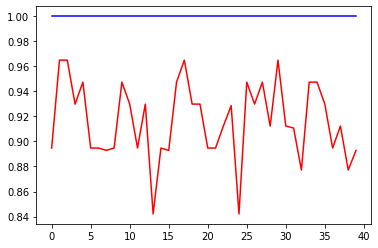

In [48]:
plt.plot(train_score, color="b")
plt.plot(val_score, color="r")
val_score

In [50]:
#Prueba con el conjunto de Test
print( "Score Test" , model.score(X_test,y_test)*100, "%")
print( "Score Total" , model.score(X,y)*100, "%")

Score Test 91.22807017543859 %
Score Total 97.18804920913884 %


## El mejor modelo con un 97,18% de score total se alcanzó usando Random Forest Classification (splits 8, nrepeats =3)